# Myeloid cells

In [1]:
import scanpy as sc
from tidyverse.dummy import *
from sctools import pipeline
from sctools.de import gene_expression_to_flat_df_NEW, scanpy_DE_to_dataframe_fast, get_de_genes
from crukiopy_release.datatools import read_metadata
from sctools.scplotting import recolor, kneeplot_split
from crukiopy_release.colormaps import celltype_order_coarse_celltype, color_dict_diagnosis, cmap_subtypes
import gc
from sccoda.util import cell_composition_data as dat
from sccoda.util import data_visualization as viz
from sccoda.util import comp_ana as mod
from cellprop_utils import plot_patient_diagnosis

from IPython.display import set_matplotlib_formats
# set_matplotlib_formats('svg')
set_matplotlib_formats('png')
from sctools.composition import clustered_heatmap_from_sccoda_CLR, compositional_pca, plot_pca_loadings

Importing tidyverse


# Create data

the original full dataset is located here:
```gsutil -m cp gs://cruk-adata-for-cellbrowser/Aug2022_adata/Atlas/Eso_Atlas.h5ad .```

In [2]:
adata = sc.read_h5ad('/home/mstrasse/TB4/Aug2022_adata/Atlas/Eso_Atlas.h5ad')

In [3]:
adata = adata[adata.obs.doublet_score<0.2]
adata = adata[adata.obs.percent_mito<0.1]

/home/mstrasse/miniconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead


/home/mstrasse/miniconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
Trying to set attribute `.uns` of view, copying.


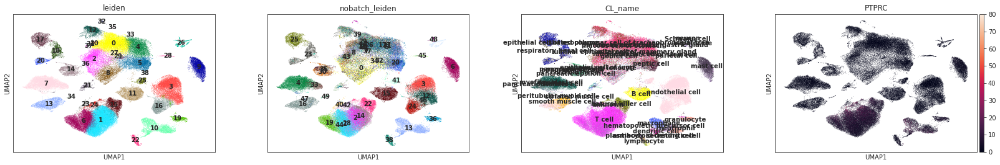

In [4]:
sc.pl.umap(adata, color=['leiden', 'nobatch_leiden', 'CL_name', 'PTPRC'], legend_loc='on data')

In [5]:
adata = adata[adata.obs.leiden.isin(['10','19'])]

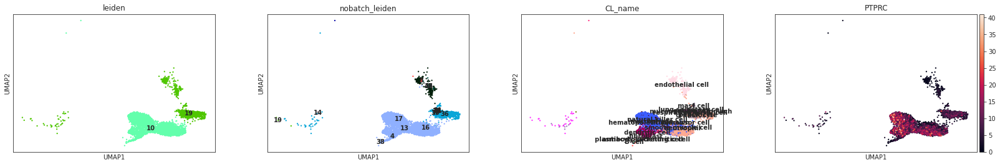

In [6]:
sc.pl.umap(adata, color=['leiden', 'nobatch_leiden', 'CL_name', 'PTPRC'], legend_loc='on data')

07/07/2022 12:28:32 AM annotating QC
07/07/2022 12:28:33 AM annotating and filtering for coding genes
/home/mstrasse/miniconda3/lib/python3.7/site-packages/sctools/annotations.py:54: DtypeWarning: Columns (8) have mixed types.Specify dtype option on import or set low_memory=False.
07/07/2022 12:28:35 AM filtering cells for UMI content
07/07/2022 12:28:36 AM Cells: 5756 -> 5756
07/07/2022 12:28:36 AM filtering cells for mito content
07/07/2022 12:28:36 AM Cells: 5756 -> 5756
07/07/2022 12:28:36 AM Annotating Cell cycle
07/07/2022 12:28:36 AM calculating cell cycle phase
07/07/2022 12:28:36 AM computing score 'S_score'
07/07/2022 12:28:36 AM computing score 'G2M_score'
07/07/2022 12:28:37 AM     'phase', cell cycle phase (adata.obs)
07/07/2022 12:28:37 AM Done: Annotating Cell cycle
07/07/2022 12:28:37 AM Zheng recipe
/home/mstrasse/miniconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  U

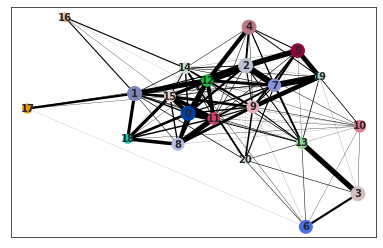

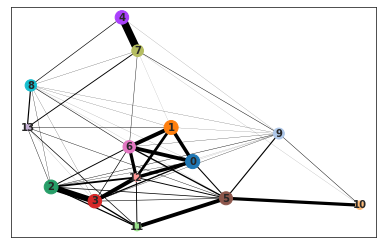

In [7]:
A = sc.AnnData(adata.X, var=adata.var, obs=adata.obs)
A.raw = A
A = pipeline.michi_kallisto_recipe(A,  harmony_correction='samplename', harmony_clusters=10)
pipeline.differential_expression_michi_kallisto_recipe(A, 'leiden')

In [8]:
# A.write_h5ad('/home/mstrasse/TB4/tmp/Myeloid_processed.h5ad')

# Analysis

In [11]:
A = sc.read_h5ad('/home/mstrasse/TB4/cellTypeProportions/Myeloid_processed.h5ad')

In [12]:
# fixing some diagnosis
from crukiopy_release.datatools import fix_diagnosis, diagnosis_fix_dict
A = fix_diagnosis(A)
A.obs.diagnosis = pd.Categorical(A.obs.diagnosis)

recolor(A, 'diagnosis', color_dict_diagnosis)
df_meta = read_metadata()

# again fix diagnosis in those samples
df_meta = df_meta[df_meta.samplename.isin(A.obs.samplename.unique())].set_index('samplename').sort_values('diagnosis')
for s, d in diagnosis_fix_dict.items():
    df_meta.loc[s, 'diagnosis'] = d

... storing 'sample_diagnosis' as categorical


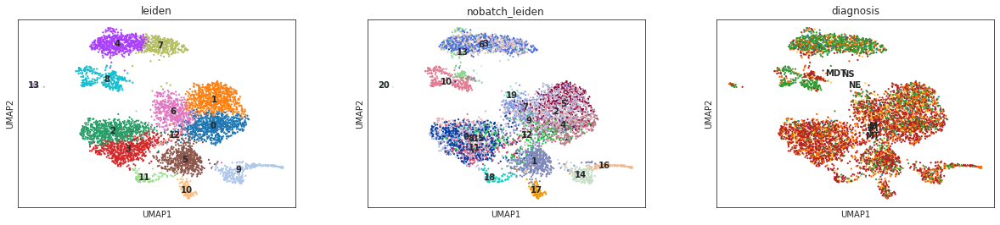

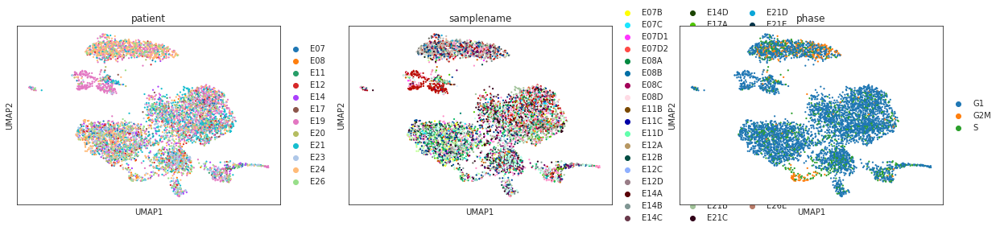

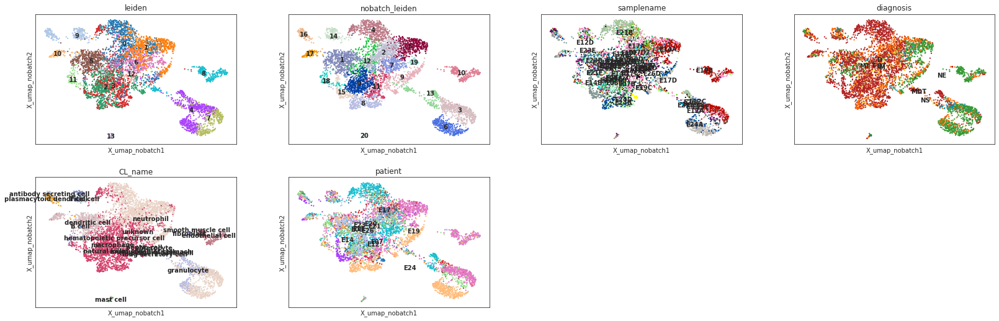

In [14]:
sc.pl.umap(A, color=['leiden', 'nobatch_leiden', 'diagnosis'], legend_loc='on data', size=20)
sc.pl.umap(A, color=['patient', 'samplename', 'phase'], size=20)

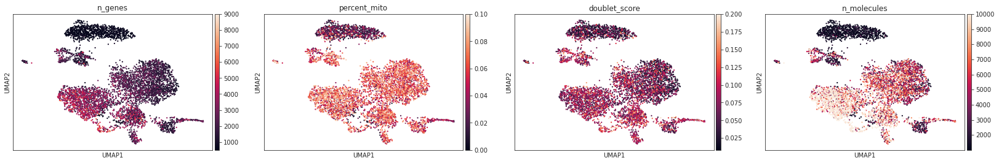

In [15]:
sc.pl.umap(A, color=['n_genes', 'percent_mito', 'doublet_score', 'n_molecules'], legend_loc='on data', size=20, vmax=[9000, 0.1, 0.2, 10000])

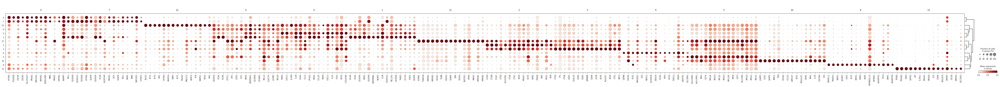

In [16]:
sc.pl.rank_genes_groups_dotplot(A, standard_scale='var', n_genes=15)

/home/mstrasse/miniconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead


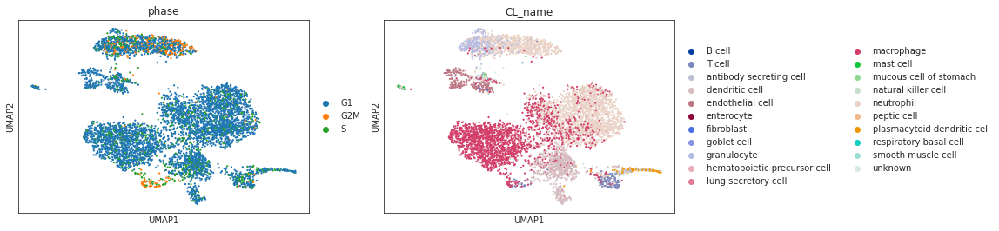

In [17]:
sc.pl.umap(A, color=['phase','CL_name'], size=20)

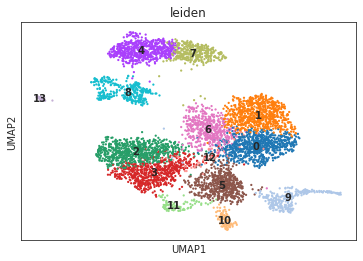

In [18]:
sc.pl.umap(A, color=['leiden'], legend_loc='on data', size=20, vmax=10)

doublets = [
    '8', '9', '13'
]
dividing = ['11']

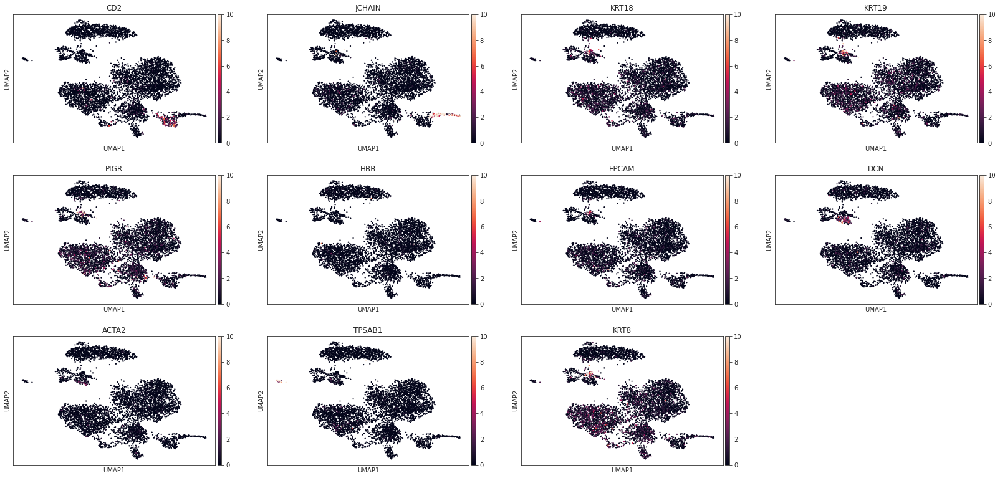

In [19]:
sc.pl.umap(A, color=['CD2','JCHAIN','KRT18', 'KRT19', 'PIGR', 'HBB', 'EPCAM', 'DCN', 'ACTA2', 'TPSAB1' ,'KRT8'], legend_loc='on data', size=20, vmax=10)

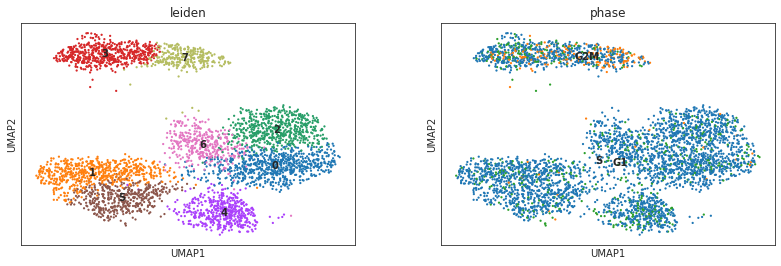

In [23]:
A = A[~A.obs.leiden.isin(doublets)]
A = A[~A.obs.leiden.isin(dividing)]
A = A[A.obs.diagnosis.isin(['NE', 'NS', 'M','D','T'])]
set_matplotlib_formats('png')

sc.pl.umap(A, color=['leiden', 'phase'], legend_loc='on data', size=20)

Trying to set attribute `.uns` of view, copying.
/home/mstrasse/miniconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
categories: 0, 1, 2, etc.
var_group_labels: 0, 1, 2, etc.


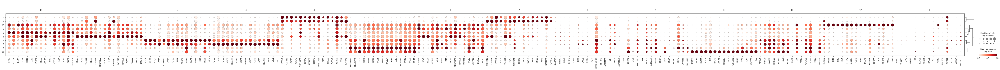

In [15]:
sc.tl.dendrogram(A, groupby='leiden')
sc.pl.rank_genes_groups_dotplot(A, standard_scale='var', n_genes=15)

# recluster

In [21]:
if 'leiden_backup' not in A.obs.columns:
    A.obs['leiden_backup'] = A.obs.leiden
sc.tl.leiden(A, resolution=0.8)

# redo DEGs on nnew clusters
pipeline.differential_expression_michi_kallisto_recipe(A, groupby='leiden')  
sc.tl.dendrogram(A, groupby='leiden')

Trying to set attribute `.obs` of view, copying.
12/18/2022 07:53:10 AM doing csr->csc
12/18/2022 07:53:10 AM done csr->csc
12/18/2022 07:53:18 AM doing csc->csr
12/18/2022 07:53:18 AM done csc->csr
12/18/2022 07:53:18 AM Filtering DE
12/18/2022 07:53:19 AM Done Filtering DE


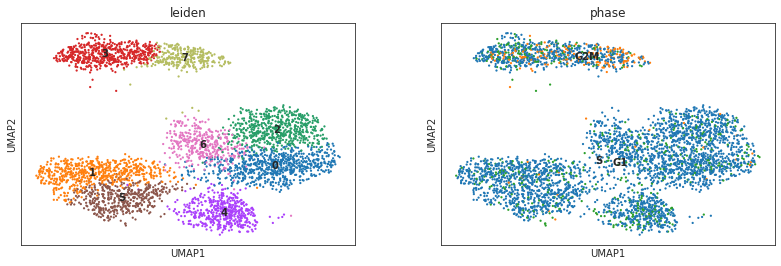

In [24]:
set_matplotlib_formats('png')
sc.pl.umap(A, color=['leiden', 'phase'], legend_loc='on data', size=20)

## Annotate those clusters a bit
see [Daves slides](https://docs.google.com/presentation/d/1Qya1LlHomIeRCEMNTwy0WMA-QwbW511D2_r6C8VYOaE/edit#slide=id.g13027ab7161_0_0)

In [52]:
annotated_clusters_dict = {
    'Neutrophils': ['3', '7'],  # FCGR3B
    'Macrophage': ['1','5'],
    'Monocytes': ['0','2','6'],
    'DC': ['4'],
}

_d = {}
for ct, clusters in annotated_clusters_dict.items():
    for c in clusters:
        _d[c] = ct
other_counter = 0
for c in A.obs.leiden.unique():
    if c in _d:
        continue
    _d[c] = f'other{other_counter}'
    other_counter+=1

In [53]:
A.obs['annotation'] = A.obs.leiden.apply(lambda x: _d[x])

... storing 'annotation' as categorical


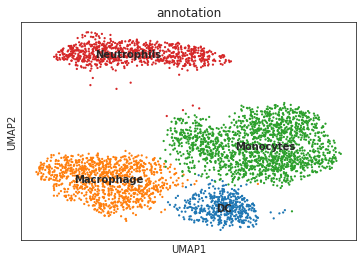

In [27]:
sc.pl.umap(A, color=['annotation'], legend_loc='on data', size=20, vmax=10) # Neutrophils

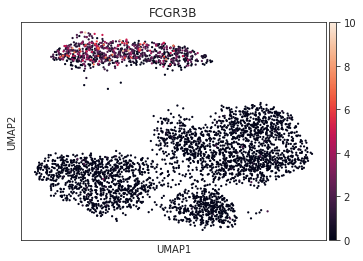

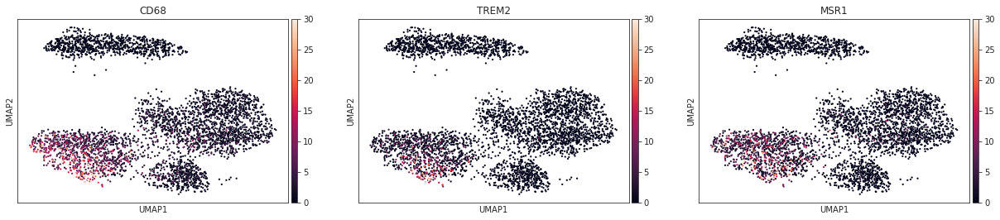

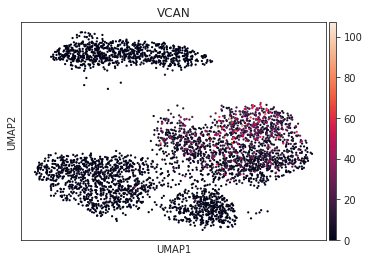

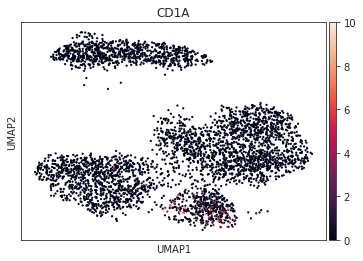

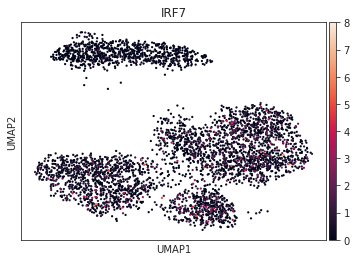

In [28]:
sc.pl.umap(A, color=['FCGR3B'], legend_loc='on data', size=20, vmax=10) # Neutrophils
sc.pl.umap(A, color=['CD68', 'TREM2', 'MSR1'], legend_loc='on data', size=20, vmax=30)  # Macro
sc.pl.umap(A, color=['VCAN'], legend_loc='on data', size=20)  # Mono
sc.pl.umap(A, color=['CD1A'], legend_loc='on data', size=20, vmax=10)  # DC
sc.pl.umap(A, color=['IRF7'], legend_loc='on data', size=20) # pDC

# SCCODA

In [2]:
mkdir /tmp/proportions

mkdir: cannot create directory ‘/tmp/proportions’: File exists


In [2]:
plotfolder = '/tmp/proportions/Myeloid_proportions/'
import os 
if not os.path.exists(plotfolder):
    os.mkdir(plotfolder)

In [3]:
A = sc.read_h5ad('/home/mstrasse/TB4/cellTypeProportions/scCODA_ready/Myeloid_processed.h5ad')
# fixing some diagnosis
from crukiopy_release.datatools import fix_diagnosis, diagnosis_fix_dict
A = fix_diagnosis(A)
A.obs.diagnosis = pd.Categorical(A.obs.diagnosis)

recolor(A, 'diagnosis', color_dict_diagnosis)
df_meta = read_metadata()

# again fix diagnosis in those samples
df_meta = df_meta[df_meta.samplename.isin(A.obs.samplename.unique())].set_index('samplename').sort_values('diagnosis')
for s, d in diagnosis_fix_dict.items():
    df_meta.loc[s, 'diagnosis'] = d

In [ ]:
data_scanpy_1 = dat.from_scanpy(
    A,
    cell_type_identifier="leiden",
    sample_identifier="samplename",
    covariate_df=df_meta[df_meta.index.isin(A.obs.samplename.unique())]
)

In [5]:
sc.pl.umap(A, color=['annotation', 'leiden'], legend_loc='on data', size=20, vmax=10) # Neutrophils

/home/mstrasse/miniconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
... storing 'sample_diagnosis' as categorical


KeyError: 'Could not find key annotation in .var_names or .obs.columns.'

<Figure size 989.28x288 with 0 Axes>

In [ ]:
cluster_order = A.obs.leiden.cat.categories
cluster_order = ['1','5', 
                '0','2','6',
                '4',
                '3','7',
                '8','9']

In [ ]:
diagnosis_ordered = ['NE', 'M','D','T', 'NS']

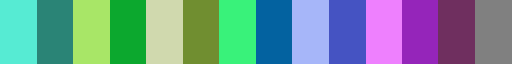

In [ ]:
cmap_subtypes

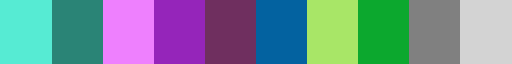

In [ ]:
# reorder a little,
from matplotlib.colors import ListedColormap
from crukiopy_release.colormaps import cmap_subtypes
_cm_colors= cmap_subtypes.colors + ['lightgrey']
_cm_colors = np.array(_cm_colors)[[0,1, 
                                   10,11,12,
                                   7,
                                   2,3, 13, 14
                                  ]]
cmap_subtypes = ListedColormap(
    _cm_colors
)
cmap_subtypes

In [ ]:
leiden_color_dict = dict(zip(cluster_order, cmap_subtypes.colors ))
_tmp = [leiden_color_dict[c] for c in A.obs.leiden.cat.categories]

if not 'leiden_colors_backup' in A.uns:
    A.uns['leiden_colors_backup']= A.uns['leiden_colors']
A.uns['leiden_colors'] = _tmp

In [22]:
# note: need to write the full 35k genes! .to_adata() neatly pulls that out of .raw and applies any other attributes from teh original adata
# B = A.raw.to_adata()
# B.uns = A.uns
# B.obsm = A.obsm
# B.obsp= A.obsp
# B.write_h5ad('/home/mstrasse/TB4/cellTypeProportions/scCODA_ready/Myeloid_processed.h5ad')

In [14]:
B = sc.read_h5ad('/home/mstrasse/TB4/cellTypeProportions/scCODA_ready/Myeloid_processed.h5ad')

In [ ]:
order = []
for d in diagnosis_ordered:
    order.extend(sorted(df_meta.query('diagnosis==@d').index))

set_matplotlib_formats('svg')
fig = viz.stacked_barplot(data_scanpy_1[:, cluster_order], feature_name="samples", figsize=(10,5), level_order=order, cmap=cmap_subtypes)
plt.xticks(rotation=90);
fig.figure.savefig(f'{plotfolder}/Myeloid_proportions_per_sample.svg')

In [39]:
set_matplotlib_formats('png')

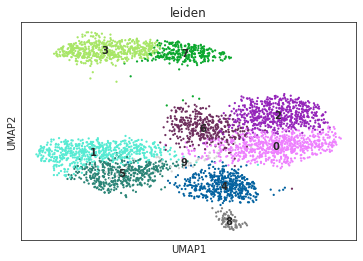

In [40]:
sc.pl.umap(A, color=['leiden'], legend_loc='on data', size=20, show=False)
plt.savefig(f'{plotfolder}/Myeloid_umap.svg')
plt.savefig(f'{plotfolder}/Myeloid_umap.png')

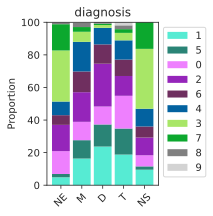

In [41]:
set_matplotlib_formats('svg')
fig = viz.stacked_barplot(data_scanpy_1[:, cluster_order], feature_name="diagnosis", level_order=diagnosis_ordered, cmap=cmap_subtypes, figsize=(2,3))
fig.figure.savefig(f'{plotfolder}/Myeloid_proportions_per_diagnosis.svg')

In [34]:
set_matplotlib_formats('png')

In [34]:
q = pd.crosstab(
    pd.Series(pd.Categorical(A.obs.leiden, categories=cluster_order), name='leiden', index=A.obs.leiden.index),
    A.obs.diagnosis
)
norm_freqs = q.div( q.sum(1), axis=0)
norm_freqs = norm_freqs.unstack().reset_index().rename({0:'frequency'}, axis=1)
norm_freqs.diagnosis = pd.Categorical(norm_freqs.diagnosis, categories=diagnosis_ordered)

/home/mstrasse/miniconda3/lib/python3.7/site-packages/plotnine/ggplot.py:721: PlotnineWarning: Saving 3 x 2 in image.
/home/mstrasse/miniconda3/lib/python3.7/site-packages/plotnine/ggplot.py:722: PlotnineWarning: Filename: /tmp/Myeloid_proportions//Myeloid_proportions_per_cluster.svg


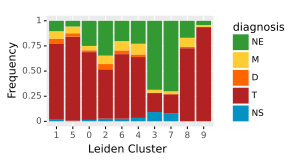

<ggplot: (8727527073233)>

In [35]:
set_matplotlib_formats('svg')
p = pn.ggplot(
    norm_freqs,
    pn.aes(x='leiden', y='frequency', fill='diagnosis')) + pn.geom_bar(stat='identity') \
+ pn.theme(figure_size=(3,2)) + pn.scale_fill_manual(color_dict_diagnosis) + pn.labs(x='Leiden Cluster', y='Frequency')

p.save(f'{plotfolder}/Myeloid_proportions_per_cluster.svg')
p

In [74]:
set_matplotlib_formats('png')

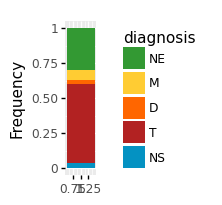

<ggplot: (8793600500729)>

In [63]:
overall_props = A.obs.diagnosis.value_counts()
overall_props = overall_props/overall_props.sum()
overall_props = overall_props.loc[diagnosis_ordered]

_ddd = pd.DataFrame(overall_props).reset_index().rename({'index': 'diagnosis','diagnosis': 'frequency'}, axis=1)
_ddd.diagnosis = pd.Categorical(_ddd.diagnosis, categories=diagnosis_ordered)

pn.ggplot(
    _ddd,
    pn.aes(x=1, y='frequency', fill='diagnosis')) + pn.geom_bar(stat='identity') \
+ pn.theme(figure_size=(7,2)) + pn.scale_fill_manual(color_dict_diagnosis) + pn.theme(figure_size=(0.4,2)) + pn.labs(x='', y='Frequency')

# MCMC

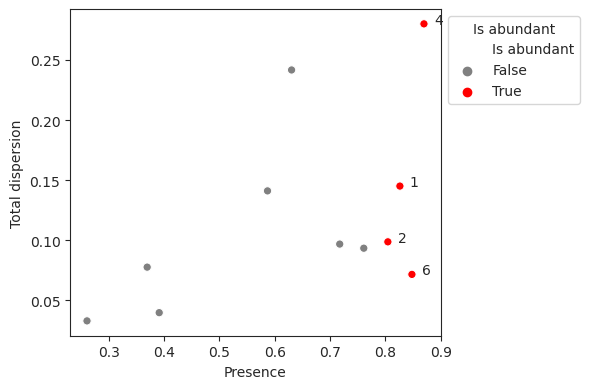

In [42]:
viz.rel_abundance_dispersion_plot(
    data=data_scanpy_1,
    abundant_threshold=0.8
)
plt.show()

In [65]:
model_salm = mod.CompositionalAnalysis(data_scanpy_1, formula="C(diagnosis, Treatment('NE')) + procedure + patient", reference_cell_type="6")
# Run MCMC
sim_results = model_salm.sample_hmc(num_results=3*20000)

Zero counts encountered in data! Added a pseudocount of 0.5.


100%|██████████| 60000/60000 [08:23<00:00, 119.26it/s]


MCMC sampling finished. (547.185 sec)
Acceptance rate: 52.4%


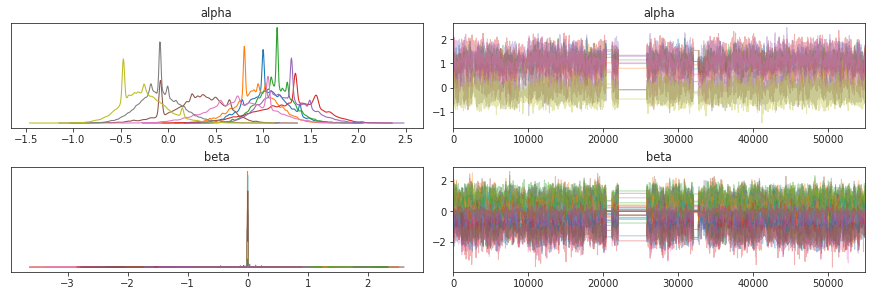

In [66]:
import arviz as az

az.plot_trace(
    sim_results,
    divergences=False,
    var_names=["alpha", "beta"],
    coords={"cell_type": sim_results.posterior.coords["cell_type_nb"]},
)
plt.show()

In [67]:
scCODA_result = sim_results.effect_df
scCODA_result[sim_results.effect_df['Final Parameter'] != 0]

Final Parameter  HDI 3%  \
Covariate                          Cell Type                            
C(diagnosis, Treatment('NE'))[T.D] 3                -1.000895  -2.001   
C(diagnosis, Treatment('NE'))[T.T] 1                 0.594428   0.115   
                                   3                -1.321975  -2.014   
                                   5                 0.987690   0.447   
                                   7                -1.228213  -1.926   

                                              HDI 97%     SD  \
Covariate                          Cell Type                   
C(diagnosis, Treatment('NE'))[T.D] 3            0.007  0.605   
C(diagnosis, Treatment('NE'))[T.T] 1            1.071  0.288   
                                   3           -0.546  0.402   
                                   5            1.529  0.305   
                                   7           -0.503  0.450   

                                              Inclusion probability  \
Covariate                          Cell Type                          
C(diagnosis, Treatment('NE'))[T.D] 3                       0.906618   
C(diagnosis, Treatment('NE'))[T.T] 1                       0.921182   
                                   3                       0.996982   
                                   5                       0.994873   
                                   7                       0.978036   

                                              Expected Sample  \
Covariate                          Cell Type                    
C(diagnosis, Treatment('NE'))[T.D] 3                 5.931177   
C(diagnosis, Treatment('NE'))[T.T] 1                18.522906   
                                   3                 3.848202   
                                   5                14.706220   
                                   7                 2.573759   

                                              log2-fold change  
Covariate                          Cell Type                    
C(diagnosis, Treatment('NE'))[T.D] 3                 -1.294362  
C(diagnosis, Treatment('NE'))[T.T] 1                  0.846288  
                                   3                 -1.918496  
                                   5                  1.413646  
                                   7                 -1.783226

In [5]:
2**1.413646


2.6640958698454544

In [68]:
_q = scCODA_result.reset_index()
a = pd.crosstab(_q['Covariate'].replace({
    "C(diagnosis, Treatment('NE'))[T.D]": 'D',
    "C(diagnosis, Treatment('NE'))[T.M]": 'M',
    "C(diagnosis, Treatment('NE'))[T.T]": 'T',
    "C(diagnosis, Treatment('NE'))[T.NS]": 'NS',
    "procedure[T.resection]": 'resection'
    }),
    _q['Cell Type'], 
    values=_q['log2-fold change']* (_q['Final Parameter'] !=0), aggfunc=np.mean).replace({np.nan: 0})

Text(6.0, 0.5, '')

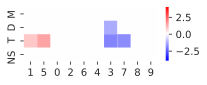

In [69]:
set_matplotlib_formats('svg')
fig, ax = plt.subplots(figsize=(3, 1))
sns.heatmap(a.loc[['M','D','T','NS'], cluster_order], cmap=plt.cm.bwr, vmin=-4, vmax=4)
# plt.title('Log2 fold change (wrt NE)')
plt.xlabel(None)
plt.ylabel(None)

In [ ]:
fig.savefig(f'{plotfolder}/Myeloid_scCODA.svg')

In [71]:
set_matplotlib_formats('png')

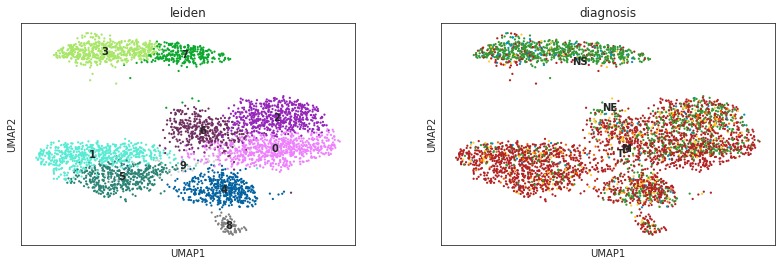

In [72]:
sc.pl.umap(A, color=['leiden', 'diagnosis'], legend_loc='on data', size=20)

# Markers

In [ ]:
from sctools.pipeline import differential_expression_michi_kallisto_recipe
differential_expression_michi_kallisto_recipe(A, groupby='leiden', min_in_group_fraction=0.5, max_out_group_fraction=0.5)

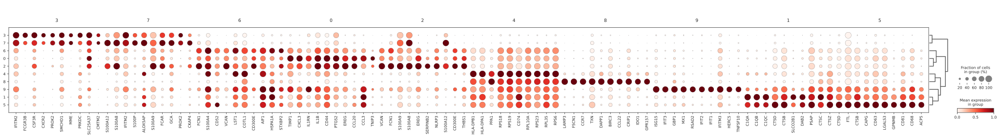

In [17]:
sc.tl.dendrogram(A, groupby='leiden')
sc.pl.rank_genes_groups_dotplot(A, standard_scale='var')

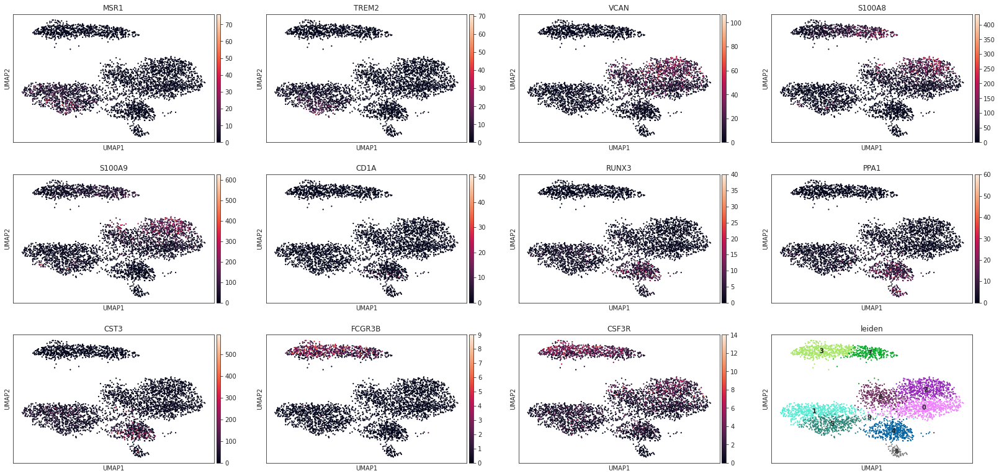

/home/mstrasse/miniconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead


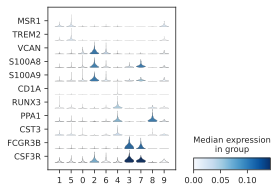

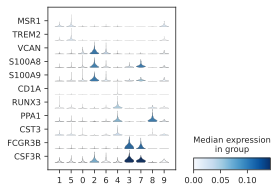

/home/mstrasse/miniconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead


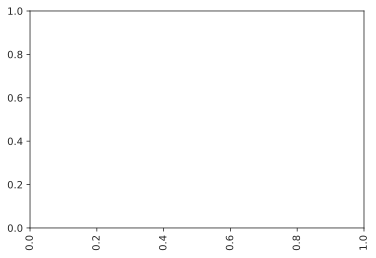

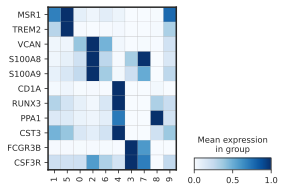

In [15]:
genes =['MSR1', 'TREM2', # CD68
        'VCAN', 'S100A8', 'S100A9',
        'CD1A',  'PPA1', 'RUNX3', 
        'FCGR3B','CSF3R',
       ]
set_matplotlib_formats('png')
sc.pl.umap(A, color=genes+['leiden'], legend_loc='on data', size=20)

B = A.copy()
B.obs['leiden'] = pd.Categorical(B.obs['leiden'], categories=cluster_order)
set_matplotlib_formats('svg')
sc.pl.stacked_violin(B, var_names=genes, groupby='leiden', standard_scale='var', swap_axes=True,show=False, #order=cluster_order
                figsize=(4,3))
plt.savefig(f'{plotfolder}/Myeloid_markers.svg')


sc.pl.stacked_violin(B, var_names=genes, groupby='leiden', standard_scale='var', swap_axes=True, use_raw=False,  #order=cluster_order
                figsize=(4,3))
plt.xticks(rotation=90);

sc.pl.matrixplot(B, var_names=genes, groupby='leiden', standard_scale='var', swap_axes=True, show=False, #order=cluster_order
                figsize=(4,3), cmap='Blues')
plt.savefig(f'{plotfolder}/Myeloid_markers_matrix.svg')